# Deep End-to-End Photo Editing
We're taking a different approach from before: we want to design a pipeline that can be trained end-to-end on photo ediitng. We have a fixed forward model, the Lightroom model, and we need to learn a set of ediitng heuristics from a user-provided set of before-after pairs.

## Objective
We begin with a set of pristine images $X$ and edited images $Y$, from which we build image pairs $(x, y), x \in X, y \in Y$. We seek a transformation $f(\cdot): X \mapsto Y$ which minimizes the *difference* between each $x$ and $y$. This objective function $g(\cdot): X \times Y \mapsto \mathbb{R}$ is a pseudosemimetric of image perceptual similarity. Choices include:
- $L_1$ or $L_2$ distances.
- [Perceptual loss](https://arxiv.org/pdf/1603.08155.pdf) by Johnson et al.
- [Ensembled Learned Perceptual Image Patch Similarity](https://arxiv.org/pdf/1906.03973.pdf) by Kettunen et al.
- Adversarial Loss from GAN literature.

## Forward
We impose incredibly strong inductive biases on the forward model. We *know* the space of operators whose composition is the manifold of suitable transformations for this task. We use a subset of these operators, including:
- Exposure
- Contrast
- Shadows
- Highlights
- Temperature
- Tint
- Yellow saturation
- Local contrast

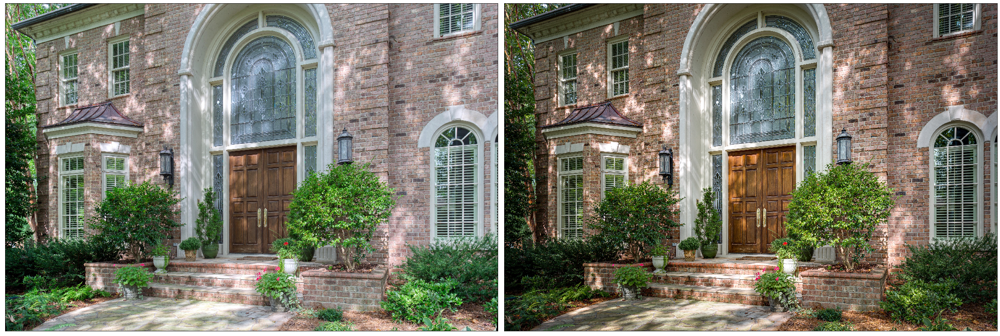

In [25]:
from numpy import asarray
from matplotlib import pyplot as plt
from PIL import Image

# Load
input = Image.open("../media/prelims/warped.jpg")
target = Image.open("../media/prelims/delivery.jpg")

# Show
plt.figure(figsize=(30, 20))
plt.subplot(1, 2, 1)
plt.xticks([])
plt.yticks([])
plt.imshow(asarray(input))
plt.subplot(1, 2, 2)
plt.xticks([])
plt.yticks([])
plt.imshow(asarray(target))
plt.tight_layout()
plt.show()

In [65]:
from plasma.filters import contrast, exposure, highlights, shadows, temperature, tint
from torch import Tensor

def linear_forward (input: Tensor, weights: Tensor) -> Tensor:
    """
    Apply the linear filter forward on a given input image. The following filters are applied in order:
    - Exposure
    - Contrast
    - Shadows
    - Highlights
    - Temperature
    - Tint
    - Yellow saturation
    - Orange saturation
    - Clarity
    
    Parameters:
        input (Tensor): Input image with shape (N,3,H,W) in range [-1., 1.].
        weights (Tensor): Filter weights with shape (N,9) in range [-1., 1.].
    """
    input = exposure(input, weights[:,0].view(-1, 1, 1, 1))
    input = contrast(input, weights[:,1].view(-1, 1, 1, 1))
    input = shadows(input.clamp(min=1e-3-1), weights[:,2].view(-1, 1, 1, 1))
    input = highlights(input.clamp(min=1e-3-1), weights[:,3].view(-1, 1, 1, 1))
    input = temperature(input, weights[:,4].view(-1, 1, 1, 1))
    input = tint(input, weights[:,5].view(-1, 1, 1, 1))
    return input

In [26]:
from torch import tensor
from torchvision.transforms import Compose, Normalize, Resize, ToPILImage, ToTensor

# Define conversion transforms
to_tensor = Compose([
    Resize(1024),
    ToTensor(),
    Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])
to_image = Compose([
    Normalize(mean=[-1., -1., -1.], std=[2., 2., 2.]),
    ToPILImage()
])

# Convert to tensor
input = to_tensor(input).unsqueeze(dim=0)
target = to_tensor(target).unsqueeze(dim=0)

We test out the forward.

In [ ]:
# Apply filter
weights = tensor([
    [0.2, 0., 0.7, -0.6, 0., 0., 0., 0., 0.]
])
result = linear_forward(input, weights)

# Write result
to_image(result.squeeze(dim=0)).save(f"filter.jpg")

## Optimization

In [64]:
from plasma.losses import PerceptualLoss
from torch.nn import L1Loss, Parameter
from torch.optim import Adam
import tableprint

# Create optimizer
weights = Parameter(data=zeros(1, 6))
optimizer = Adam([weights], lr=0.1)

# Create loss
l1_loss = L1Loss()
#perceptual_loss = PerceptualLoss()

# Print table
HEADERS = ["Iteration", "Loss"]
print()
print(tableprint.header(HEADERS))

# Optimize
for step in range(10):
    # Forward pass and compute loss
    result = linear_forward(input, weights.tanh())
    loss_total = l1_loss(result, target)
    # Backprop
    optimizer.zero_grad()
    loss_total.backward()
    optimizer.step()
    # Log 
    print(tableprint.row([f"{step}", f"{loss_total:.4f}"]))
print(tableprint.bottom(len(HEADERS)))

# Write result
to_image(result.squeeze(dim=0)).save(f"optimum.jpg")


╭─────────────┬─────────────╮
│  Iteration  │    Loss     │
├─────────────┼─────────────┤
weight tensor([[0., 0., 0., 0., 0., 0.]], grad_fn=<TanhBackward>)
input? tensor(False)
exposure? tensor(False)
contrast? tensor(False)
shadows? tensor(False)
highlights? tensor(False)
temperature? tensor(False)
tint? tensor(False)
grad tensor([[ 0.5427, -0.0491,  0.0317,  0.0197, -0.0842,  0.1167]])
│           0 │      0.2213 │
weight tensor([[-0.0997,  0.0997, -0.0997, -0.0997,  0.0997, -0.0997]],
       grad_fn=<TanhBackward>)
input? tensor(False)
exposure? tensor(False)
contrast? tensor(False)
shadows? tensor(False)
highlights? tensor(False)
temperature? tensor(False)
tint? tensor(False)
grad tensor([[ 0.1528,  0.0062, -0.0025,  0.0019, -0.0263,  0.0035]])
│           1 │      0.1675 │
weight tensor([[-0.1826,  0.1558, -0.1596, -0.1721,  0.1840, -0.1676]],
       grad_fn=<TanhBackward>)
input? tensor(False)
exposure? tensor(False)
contrast? tensor(False)
shadows? tensor(False)
highlights? ten